## Practical Work 1

For this practical work, the trainees will develop a Python program that is able to implement the gradient descent in order to achieve the linear regression (Single and Multivariables) of a set of datapoints.

#### Import numpy, matplotlib.pyplot and any library you will need

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline

#### Read RegData csv file into numpy array 

In [2]:
data = np.genfromtxt('RegData.csv',delimiter=',')

In [3]:
data

array([[2.9000001 , 4.        ],
       [6.69999981, 7.4000001 ],
       [4.9000001 , 5.        ],
       [7.9000001 , 7.19999981],
       [9.80000019, 7.9000001 ],
       [6.9000001 , 6.0999999 ],
       [6.0999999 , 6.        ],
       [6.19999981, 5.80000019],
       [6.        , 5.19999981],
       [5.0999999 , 4.19999981],
       [4.69999981, 4.        ],
       [4.4000001 , 4.4000001 ],
       [5.80000019, 5.19999981]])

#### Define variables X and y. 
#### Assign first column data to X and second column to y
<b>Note:</b> X is the independent variable (input to LR model) and y is the dependent variable (output)

In [4]:
X = data[:, 0]
y = data[:, 1]
X.shape, y.shape

((13,), (13,))

#### Explore your data

In [5]:
X

array([2.9000001 , 6.69999981, 4.9000001 , 7.9000001 , 9.80000019,
       6.9000001 , 6.0999999 , 6.19999981, 6.        , 5.0999999 ,
       4.69999981, 4.4000001 , 5.80000019])

In [6]:
y

array([4.        , 7.4000001 , 5.        , 7.19999981, 7.9000001 ,
       6.0999999 , 6.        , 5.80000019, 5.19999981, 4.19999981,
       4.        , 4.4000001 , 5.19999981])

#### Plot the original data (scatter plot of X,y)

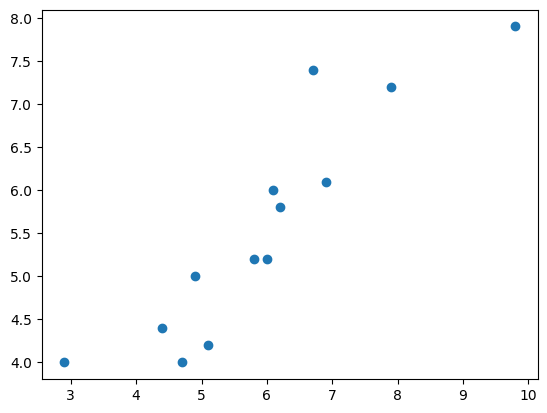

In [7]:
plt.scatter(X, y)

## LR Full Implementation

### Step1: Initialize parameters (theta_0 & theta_1) with random value or simply zero. Also choose the Learning rate.

In [8]:
theta_0  = 0
theta_1 = 0
alpha = .0001

### Step2: Use (theta_0 & theta_1) to predict the output h(x)= theta_0 + theta_1 * x.

In [9]:
y_hat = theta_0 + theta_1 * X
print(f"h(x):{y_hat}")

h(x):[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


### Step3: Calculate the MSE Cost function 𝑱(theta_0,theta_1 ).
<b>Note:</b> You better use either dot product or norm square of the error vector.

In [10]:
m = len(X)

# def cost(theta_0, theta_1, m):
#     err_vec = y_hat - y
#     j = (1 / (2 * m)) * np.sum(np.square(err_vec))
#     return err_vec, j
# 
# err_vec, j = cost(theta_0, theta_1, m)

err_vec = y_hat - y
j = (1 / (2 * m)) * np.sum(np.square(err_vec))

print(f"Error Vector:\n{err_vec}\n\nj = {j}")

Error Vector:
[-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981]

j = 16.305384479692318


### Step4: Calculate the gradient components for theta_0 and theta_1.
<b>Note:</b> You can use the error vector calculated in the previous step.

In [11]:
d_theta_0 = (1 / m) * np.sum(err_vec * 1)
d_theta_1 = (1 / m) * np.sum(err_vec * X)
print(f"d_theta_0 : {d_theta_0}")
print(f"d_theta_1 : {d_theta_1}")

d_theta_0 : -5.569230739769231
d_theta_1 : -35.043846043215375


### Step5: Update the parameters (simultaneously).

In [12]:
# def update(theta, d_theta, alpha):
#     return theta - alpha * d_theta

# theta_0_new = update(theta_0, d_theta_0, alpha)
# theta_1_new = update(theta_1, d_theta_1, alpha)

theta_0_new = theta_0 - alpha * d_theta_0
theta_1_new = theta_1 - alpha * d_theta_1
print(f"theta_0_new : {theta_0_new}")
print(f"theta_1_new : {theta_1_new}")

theta_0_new : 0.0005569230739769231
theta_1_new : 0.003504384604321538


### Step6: Repeat from 2 to 5 until converge to the minimum or achieve maximum iterations.
#### The objective from this step is to combine all the previous steps and iterate untill you either achieve the maximum number of iterations or reach the minimum.

In [13]:
theta_0 = 0                                                     # Initialization    
theta_1 = 0
alpha = .001
m = len(X)

for i in range(1000):
    print('*' * 20 , f'Iteration {i}', '*' * 20, '\n')
    y_hat = theta_0 + theta_1 * X                               # Predictions
    print(f"h(x):{y_hat}\n")

    err_vec = y_hat - y                                         # Error Vector    
    j = (1 / (2 * m)) * np.sum(np.square(err_vec))              # Cost Function
    print(f"Error Vector:\n{err_vec}\n\nj = {j}\n")

    d_theta_0 = (1 / m) * np.sum(err_vec * 1)                   # Theta 0 gradient
    d_theta_1 = (1 / m) * np.sum(err_vec * X)                   # Theta 1 gradient
    print(f"d_theta_0 : {d_theta_0}")
    print(f"d_theta_1 : {d_theta_1}\n")

    grad_vec = np.array([d_theta_0, d_theta_1])
    grad_norm = np.linalg.norm(grad_vec)
    print(f"Gradient Vector : {grad_vec}")
    print(f"Gradient Vector Norm : {grad_norm}\n")

    if grad_norm < .1:                                                  # Termination Condition
        print(f"Converged after {i} iteration")
        break

    theta_0 = theta_0 - alpha * d_theta_0                       # Theta 0 update
    theta_1 = theta_1 - alpha * d_theta_1                       # Theta 1 update
    print(f"theta_0_new : {theta_0}")
    print(f"theta_1_new : {theta_1}\n")

    

******************** Iteration 0 ******************** 

h(x):[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]

Error Vector:
[-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981]

j = 16.305384479692318

d_theta_0 : -5.569230739769231
d_theta_1 : -35.043846043215375

Gradient Vector : [ -5.56923074 -35.04384604]
Gradient Vector Norm : 35.483622652335995

theta_0_new : 0.005569230739769231
theta_1_new : 0.03504384604321537

******************** Iteration 1 ******************** 

h(x):[0.10719639 0.24036299 0.17728408 0.28241562 0.34899893 0.24737177
 0.21933669 0.22284107 0.21583231 0.18429284 0.1702753  0.15976216
 0.20882354]

Error Vector:
[-3.89280361 -7.1596371  -4.82271592 -6.91758419 -7.55100117 -5.85262813
 -5.78066331 -5.57715912 -4.9841675  -4.01570697 -3.8297247  -4.24023794
 -4.99117626]

j = 15.070907994095794

d_theta_0 : -5.355015840795694
d_theta_1 : -33.673306701894624

Gradi

In [14]:
theta_0 = 0                                                     # Initialization    
theta_1 = 0
alpha = .01
m = len(X)

for i in range(1000):
    print('*' * 20 , f'Iteration {i}', '*' * 20, '\n')
    y_hat = theta_0 + theta_1 * X                               # Predictions
    print(f"h(x):{y_hat}\n")

    err_vec = y_hat - y                                         # Error Vector    
    j = (1 / (2 * m)) * np.sum(np.square(err_vec))              # Cost Function
    print(f"Error Vector:\n{err_vec}\n\nj = {j}\n")

    d_theta_0 = (1 / m) * np.sum(err_vec * 1)                   # Theta 0 gradient
    d_theta_1 = (1 / m) * np.sum(err_vec * X)                   # Theta 1 gradient
    print(f"d_theta_0 : {d_theta_0}")
    print(f"d_theta_1 : {d_theta_1}\n")

    grad_vec = np.array([d_theta_0, d_theta_1])
    grad_norm = np.linalg.norm(grad_vec)
    print(f"Gradient Vector : {grad_vec}")
    print(f"Gradient Vector Norm : {grad_norm}\n")

    if grad_norm < .1:                                                  # Termination Condition
        print(f"Converged after {i} iteration")
        break

    theta_0 = theta_0 - alpha * d_theta_0                       # Theta 0 update
    theta_1 = theta_1 - alpha * d_theta_1                       # Theta 1 update
    print(f"theta_0_new : {theta_0}")
    print(f"theta_1_new : {theta_1}\n")

    

******************** Iteration 0 ******************** 

h(x):[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]

Error Vector:
[-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981]

j = 16.305384479692318

d_theta_0 : -5.569230739769231
d_theta_1 : -35.043846043215375

Gradient Vector : [ -5.56923074 -35.04384604]
Gradient Vector Norm : 35.483622652335995

theta_0_new : 0.05569230739769231
theta_1_new : 0.35043846043215376

******************** Iteration 1 ******************** 

h(x):[1.07196388 2.40362993 1.7728408  2.82415618 3.48998929 2.47371772
 2.19336688 2.2284107  2.15832307 1.84292842 1.702753   1.59762157
 2.08823544]

Error Vector:
[-2.92803612 -4.99637017 -3.2271592  -4.37584363 -4.41001081 -3.62628219
 -3.80663312 -3.5715895  -3.04167674 -2.35707139 -2.297247   -2.80237853
 -3.11176436]

j = 6.175608808043305

d_theta_0 : -3.427081750033853
d_theta_1 : -21.338452630007843

Gradien

#### Predict y values using the LR equation
##### h(x)= theta_0 + theta_1 * x

In [15]:
y_predict = theta_0 + theta_1 * X
print(f"h(x) = y_predict: \n{y_predict}\n")
print(f"y_actual : \n{y}")

h(x) = y_predict: 
[2.74498295 6.14196626 4.53286904 7.21469817 8.91319004 6.32075512
 5.60560052 5.69499474 5.5162063  4.71165748 4.35408017 4.08589751
 5.33741786]

y_actual : 
[4.         7.4000001  5.         7.19999981 7.9000001  6.0999999
 6.         5.80000019 5.19999981 4.19999981 4.         4.4000001
 5.19999981]


#### Plot  LR equation output (fitted line) with the original data (scatter plot of X,y)

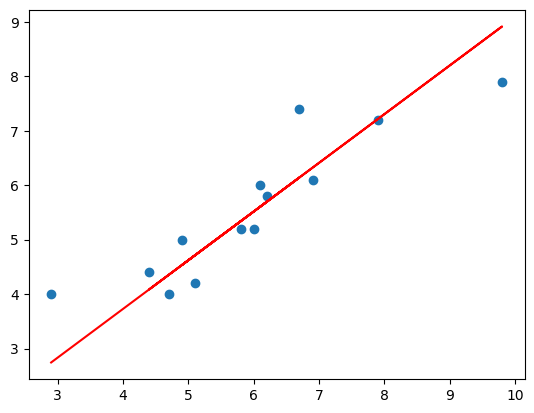

In [16]:
plt.scatter(X,y)
plt.plot(X, y_predict, color='red')

#### Use R2 score to evaluate LR equation output
https://www.youtube.com/watch?v=KccCy0hu-dM

In [17]:
from sklearn.metrics import r2_score
print(r2_score(y, y_predict))

0.7480324921408193


In [18]:
theta_0 = 0                                                     # Initialization    
theta_1 = 0
alpha = .001
m = len(X)

for i in range(10_000):
    print('*' * 20 , f'Iteration {i}', '*' * 20, '\n')
    y_hat = theta_0 + theta_1 * X                               # Predictions
    print(f"h(x):{y_hat}\n")

    err_vec = y_hat - y                                         # Error Vector    
    j = (1 / (2 * m)) * np.sum(np.square(err_vec))              # Cost Function
    print(f"Error Vector:\n{err_vec}\n\nj = {j}\n")

    d_theta_0 = (1 / m) * np.sum(err_vec * 1)                   # Theta 0 gradient
    d_theta_1 = (1 / m) * np.sum(err_vec * X)                   # Theta 1 gradient
    print(f"d_theta_0 : {d_theta_0}")
    print(f"d_theta_1 : {d_theta_1}\n")

    grad_vec = np.array([d_theta_0, d_theta_1])
    grad_norm = np.linalg.norm(grad_vec)
    print(f"Gradient Vector : {grad_vec}")
    print(f"Gradient Vector Norm : {grad_norm}\n")

    if grad_norm < .04:                                                  # Termination Condition
        print(f"Converged after {i} iteration")
        break

    theta_0 = theta_0 - alpha * d_theta_0                       # Theta 0 update
    theta_1 = theta_1 - alpha * d_theta_1                       # Theta 1 update
    print(f"theta_0_new : {theta_0}")
    print(f"theta_1_new : {theta_1}\n")

    

******************** Iteration 0 ******************** 

h(x):[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]

Error Vector:
[-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981]

j = 16.305384479692318

d_theta_0 : -5.569230739769231
d_theta_1 : -35.043846043215375

Gradient Vector : [ -5.56923074 -35.04384604]
Gradient Vector Norm : 35.483622652335995

theta_0_new : 0.005569230739769231
theta_1_new : 0.03504384604321537

******************** Iteration 1 ******************** 

h(x):[0.10719639 0.24036299 0.17728408 0.28241562 0.34899893 0.24737177
 0.21933669 0.22284107 0.21583231 0.18429284 0.1702753  0.15976216
 0.20882354]

Error Vector:
[-3.89280361 -7.1596371  -4.82271592 -6.91758419 -7.55100117 -5.85262813
 -5.78066331 -5.57715912 -4.9841675  -4.01570697 -3.8297247  -4.24023794
 -4.99117626]

j = 15.070907994095794

d_theta_0 : -5.355015840795694
d_theta_1 : -33.673306701894624

Gradi

In [19]:
y_predict = theta_0 + theta_1 * X
print(r2_score(y, y_predict))

0.8026887324190686


## Plot loss function
### Repeat your implementaion version and save loss for each iteration (epoch)

In [20]:
theta_0 = 0                                                     # Initialization    
theta_1 = 0
alpha = .001
m = len(X)
loss = []

for i in range(1000):
    print('*' * 20 , f'Iteration {i}', '*' * 20, '\n')
    y_hat = theta_0 + theta_1 * X                               # Predictions
    print(f"h(x):{y_hat}\n")

    err_vec = y_hat - y                                         # Error Vector    
    j = (1 / (2 * m)) * np.sum(np.square(err_vec))              # Cost Function
    loss.append(j)
    print(f"Error Vector:\n{err_vec}\n\nj = {j}\n")

    d_theta_0 = (1 / m) * np.sum(err_vec * 1)                   # Theta 0 gradient
    d_theta_1 = (1 / m) * np.sum(err_vec * X)                   # Theta 1 gradient
    print(f"d_theta_0 : {d_theta_0}")
    print(f"d_theta_1 : {d_theta_1}\n")

    grad_vec = np.array([d_theta_0, d_theta_1])
    grad_norm = np.linalg.norm(grad_vec)
    print(f"Gradient Vector : {grad_vec}")
    print(f"Gradient Vector Norm : {grad_norm}\n")

    if grad_norm < .1:                                                  # Termination Condition
        print(f"Converged after {i} iteration")
        break

    theta_0 = theta_0 - alpha * d_theta_0                       # Theta 0 update
    theta_1 = theta_1 - alpha * d_theta_1                       # Theta 1 update
    print(f"theta_0_new : {theta_0}")
    print(f"theta_1_new : {theta_1}\n")

    

******************** Iteration 0 ******************** 

h(x):[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]

Error Vector:
[-4.         -7.4000001  -5.         -7.19999981 -7.9000001  -6.0999999
 -6.         -5.80000019 -5.19999981 -4.19999981 -4.         -4.4000001
 -5.19999981]

j = 16.305384479692318

d_theta_0 : -5.569230739769231
d_theta_1 : -35.043846043215375

Gradient Vector : [ -5.56923074 -35.04384604]
Gradient Vector Norm : 35.483622652335995

theta_0_new : 0.005569230739769231
theta_1_new : 0.03504384604321537

******************** Iteration 1 ******************** 

h(x):[0.10719639 0.24036299 0.17728408 0.28241562 0.34899893 0.24737177
 0.21933669 0.22284107 0.21583231 0.18429284 0.1702753  0.15976216
 0.20882354]

Error Vector:
[-3.89280361 -7.1596371  -4.82271592 -6.91758419 -7.55100117 -5.85262813
 -5.78066331 -5.57715912 -4.9841675  -4.01570697 -3.8297247  -4.24023794
 -4.99117626]

j = 15.070907994095794

d_theta_0 : -5.355015840795694
d_theta_1 : -33.673306701894624

Gradi

### Plot loss vs. iterations

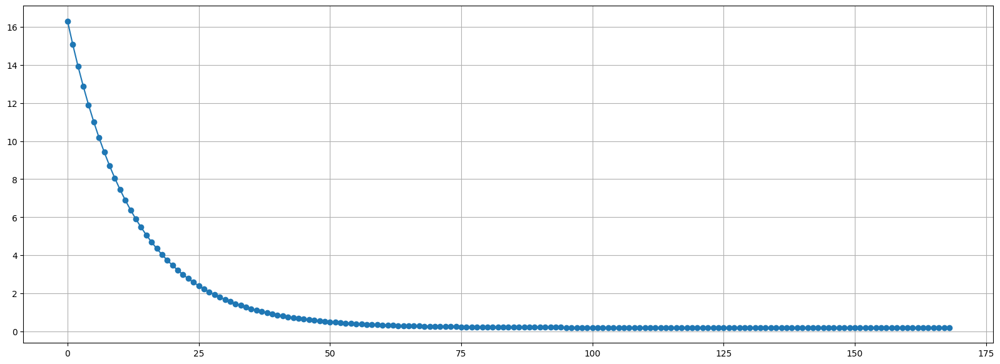

In [21]:
plt.figure(figsize=(20, 7))
plt.plot(range(len(loss)), loss, marker='o')
plt.grid()

## Multivariate LR

#### Read MultiVarLR csv file into numpy array.
#### The first three columns are x1,x2, and x3.
#### The last column is the target label y.

In [22]:
data2 = np.genfromtxt('MultiVarLR.csv',delimiter=',')

In [23]:
data2

array([[ 73.,  80.,  75., 152.],
       [ 93.,  88.,  93., 185.],
       [ 89.,  91.,  90., 180.],
       [ 96.,  98., 100., 196.],
       [ 73.,  66.,  70., 142.],
       [ 53.,  46.,  55., 101.],
       [ 69.,  74.,  77., 149.],
       [ 47.,  56.,  60., 115.],
       [ 87.,  79.,  90., 175.],
       [ 79.,  70.,  88., 164.],
       [ 69.,  70.,  73., 141.],
       [ 70.,  65.,  74., 141.],
       [ 93.,  95.,  91., 184.],
       [ 79.,  80.,  73., 152.],
       [ 70.,  73.,  78., 148.],
       [ 93.,  89.,  96., 192.],
       [ 78.,  75.,  68., 147.],
       [ 81.,  90.,  93., 183.],
       [ 88.,  92.,  86., 177.],
       [ 78.,  83.,  77., 159.],
       [ 82.,  86.,  90., 177.],
       [ 86.,  82.,  89., 175.],
       [ 78.,  83.,  85., 175.],
       [ 76.,  83.,  71., 149.],
       [ 96.,  93.,  95., 192.]])

In [24]:
X2 = data2[:, 0:3]
y2 = data2[:, 3].reshape(-1, 1)
X2.shape, y2.shape

((25, 3), (25, 1))

In [25]:
X2

array([[ 73.,  80.,  75.],
       [ 93.,  88.,  93.],
       [ 89.,  91.,  90.],
       [ 96.,  98., 100.],
       [ 73.,  66.,  70.],
       [ 53.,  46.,  55.],
       [ 69.,  74.,  77.],
       [ 47.,  56.,  60.],
       [ 87.,  79.,  90.],
       [ 79.,  70.,  88.],
       [ 69.,  70.,  73.],
       [ 70.,  65.,  74.],
       [ 93.,  95.,  91.],
       [ 79.,  80.,  73.],
       [ 70.,  73.,  78.],
       [ 93.,  89.,  96.],
       [ 78.,  75.,  68.],
       [ 81.,  90.,  93.],
       [ 88.,  92.,  86.],
       [ 78.,  83.,  77.],
       [ 82.,  86.,  90.],
       [ 86.,  82.,  89.],
       [ 78.,  83.,  85.],
       [ 76.,  83.,  71.],
       [ 96.,  93.,  95.]])

In [26]:
y2

array([[152.],
       [185.],
       [180.],
       [196.],
       [142.],
       [101.],
       [149.],
       [115.],
       [175.],
       [164.],
       [141.],
       [141.],
       [184.],
       [152.],
       [148.],
       [192.],
       [147.],
       [183.],
       [177.],
       [159.],
       [177.],
       [175.],
       [175.],
       [149.],
       [192.]])

### Generalize your implementation to work for MultiVariables
#### Vectorize your implementation.
<b>Notes:</b> 
- You need to add column that contains ones to the data. This column represent x feature for theta_0.
- Use learninig rate = 0.0001.

In [27]:
X2 = np.concatenate([np.ones_like(y2), X2], axis=1)

In [28]:
y_hat = np.dot(X2, np.zeros((X2.shape[1], 1))) 
err_vec = y_hat - y2                                         # Error Vector    
j = (1 / (2 * m)) * np.sum(np.square(err_vec))
grad_vec = np.dot(X2.T, err_vec) / m
X2.shape, y_hat.shape, y2.shape, err_vec.shape, j.shape, grad_vec.shape

((25, 4), (25, 1), (25, 1), (25, 1), (), (4, 1))

In [29]:
theta = np.zeros((X2.shape[1], 1))                              # Initialization    
alpha = .0001
m = len(y2)
loss = []

for i in range(10_000):
    print('*' * 20 , f'Iteration {i}', '*' * 20, '\n')
    y_hat = np.dot(X2, theta)                                   # Predictions
    print(f"h(x):{y_hat}\n")

    err_vec = y_hat - y2                                         # Error Vector    
    j = (1 / (2 * m)) * np.sum(np.square(err_vec))              # Cost Function
    loss.append(j)
    print(f"Error Vector:\n{err_vec}\n\nj = {j}\n")

    # d_theta_0 = (1 / m) * np.sum(err_vec * 1)                   # Theta 0 gradient
    # d_theta_1 = (1 / m) * np.sum(err_vec * X)                   # Theta 1 gradient
    grad_vec = np.dot(X2.T, err_vec) / m

    grad_norm = np.linalg.norm(grad_vec)
    print(f"Gradient Vector : {grad_vec}")
    print(f"Gradient Vector Norm : {grad_norm}\n")

    if grad_norm < .2:                                                  # Termination Condition
        print(f"Converged after {i} iteration")
        break

    theta = theta - alpha * grad_vec                              # Theta 0 update
    print(f"theta_new : {theta}")
    

******************** Iteration 0 ******************** 

h(x):[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]

Error Vector:
[[-152.]
 [-185.]
 [-180.]
 [-196.]
 [-142.]
 [-101.]
 [-149.]
 [-115.]
 [-175.]
 [-164.]
 [-141.]
 [-141.]
 [-184.]
 [-152.]
 [-148.]
 [-192.]
 [-147.]
 [-183.]
 [-177.]
 [-159.]
 [-177.]
 [-175.]
 [-175.]
 [-149.]
 [-192.]]

j = 13405.98

Gradient Vector : [[  -162.04]
 [-13075.8 ]
 [-13147.2 ]
 [-13467.08]]
Gradient Vector Norm : 22917.5459892197

theta_new : [[0.016204]
 [1.30758 ]
 [1.31472 ]
 [1.346708]]
******************** Iteration 1 ******************** 

h(x):[[301.650244]
 [362.560348]
 [357.234064]
 [389.057244]
 [276.510624]
 [203.864004]
 [291.22502 ]
 [215.899264]
 [338.842264]
 [313.855728]
 [280.579308]
 [276.659996]
 [369.069972]
 [306.802308]
 [292.564588]
 [367.915192]
 [292.187588]
 [349.498828]
 [351.854372]
 [314.82572 ]
 [341.507404]
 [34

Gradient Vector : [[ 0.0651666 ]
 [ 1.63360554]
 [ 0.5981504 ]
 [-2.17293753]]
Gradient Vector Norm : 2.784305146999862

theta_new : [[0.0050424 ]
 [0.48360233]
 [0.52842217]
 [1.00487524]]
******************** Iteration 691 ******************** 

h(x):[[152.94742897]
 [184.93460723]
 [181.5708387 ]
 [198.70376259]
 [140.5251424 ]
 [105.21152383]
 [149.85223711]
 [112.61850774]
 [174.26256801]
 [163.62819936]
 [143.71904748]
 [142.5654142 ]
 [186.62381194]
 [153.83929247]
 [150.81229251]
 [188.47765511]
 [145.6892031 ]
 [180.18822361]
 [177.59615758]
 [158.96045761]
 [175.54351154]
 [174.35935695]
 [166.99945952]
 [151.96400152]
 [191.03727554]]

Error Vector:
[[ 0.94742897]
 [-0.06539277]
 [ 1.5708387 ]
 [ 2.70376259]
 [-1.4748576 ]
 [ 4.21152383]
 [ 0.85223711]
 [-2.38149226]
 [-0.73743199]
 [-0.37180064]
 [ 2.71904748]
 [ 1.5654142 ]
 [ 2.62381194]
 [ 1.83929247]
 [ 2.81229251]
 [-3.52234489]
 [-1.3107969 ]
 [-2.81177639]
 [ 0.59615758]
 [-0.03954239]
 [-1.45648846]
 [-0.64064305]
 

#### Predict y values using the LR equation 
##### X@thetas

In [30]:
print(f"h(x) = y_predict: \n{X2@theta}")

h(x) = y_predict: 
[[152.91099637]
 [184.64281272]
 [181.38446819]
 [198.8431854 ]
 [139.95522625]
 [105.2845922 ]
 [150.53085163]
 [113.93318063]
 [174.34754891]
 [164.43754799]
 [143.94704015]
 [142.81011161]
 [186.07691277]
 [152.87604883]
 [151.4943701 ]
 [188.53044781]
 [144.27849537]
 [181.27956687]
 [177.05842637]
 [158.56695943]
 [176.18438562]
 [174.43425395]
 [167.53368834]
 [151.10633452]
 [190.61342106]]


### Plot loss vs. iterations

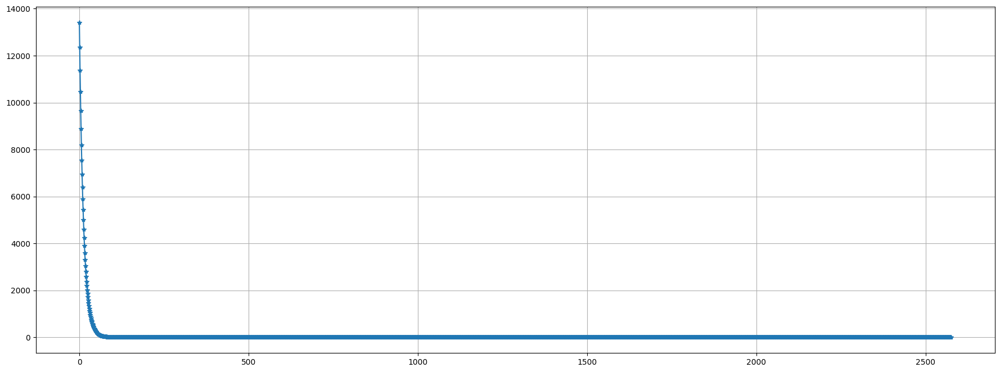

In [31]:
plt.figure(figsize=(22, 8))
plt.plot(range(len(loss)), loss, marker="*")
plt.grid()

#### Use R2 score to evaluate LR equation output

In [32]:
y_pred = X2@theta
r2_score(y2, y_pred)

0.9890065057519923